# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

## Setup

In [149]:
!rm -rf cvr_course
!git clone https://github.com/tndrd/cvr_course -b main

Cloning into 'cvr_course'...
remote: Enumerating objects: 533, done.
remote: Counting objects: 100% (42/42), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 533 (delta 17), reused 23 (delta 5), pack-reused 491
Receiving objects: 100% (533/533), 103.53 MiB | 16.45 MiB/s, done.
Resolving deltas: 100% (124/124), done.


In [150]:
cd cvr_course

/content/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course


In [151]:
!git checkout hw3

Branch 'hw3' set up to track remote branch 'hw3' from 'origin'.
Switched to a new branch 'hw3'


In [152]:
cd notebooks

/content/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks/cvr_course/notebooks


In [153]:
import numpy as np
import cv2
import time
import os
import math
import sys
import glob
from copy import *
from matplotlib import pyplot as plt
from random import randint
plt.rcParams["figure.figsize"] = (10,10)

## Frequently used functions

In [154]:
low_th  = (180, 180, 180)
high_th = (255, 255, 255)

In [155]:
def show(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [156]:
def thresholding(img):
    blurred = cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)
    mask = cv2.inRange (blurred, low_th, high_th)
    return mask

In [157]:
def approximateContour(contour, epsilon):
    approx  = cv2.convexHull(contour)
    epsilon = epsilon * cv2.arcLength (approx, True)
    approx  = cv2.approxPolyDP (approx, epsilon, True)
    return approx

In [158]:
def findPaperBorder(contours, epsilon=0.05):
    
    assert len(contours) > 0
    
    approx = approximateContour(contours[0], epsilon)
    return approx

In [159]:
def drawText(image, text, point, size, color=(255, 0, 0)):
    font = cv2.FONT_HERSHEY_SIMPLEX
    fontScale = 1
    cv2.putText(image, text, tuple(point), font, fontScale, color, size, cv2.LINE_AA)

In [160]:
def debugShowAllContours(image, contours):
    canvas = image.copy()
    cv2.drawContours(canvas, contours, -1, (255,0,0), 2)
    show(canvas)

In [161]:
def defaultFindContours(mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    return contours

In [162]:
def underline(): print("-------------------------------------------------------------------")

## Task #1

In [163]:
fnames = glob.glob("../data/imgs/arrow/*.png")

images = []

for fname in fnames:
    img = cv2.imread(fname)
    images.append(img)

## Task #2

Код с семинара не работал на всех картинках. Добавил размытие и немного понизил нижний порог цвета. Заработало.
Понятно, что для изображений с обрезанными углами значения будут неточными.
Не очень понятна формула для нахождения расстояния (см. ниже).

In [164]:
def findPaperDistance (contours):

    approx = findPaperBorder(contours)
    length = cv2.arcLength (approx, True)
    
    # Предположу, что тут имеется в виду distance = focal_dist * real_perimeter / rect_on_image_perimeter   
    distance = 180.0 * 364 / length
    
    return distance

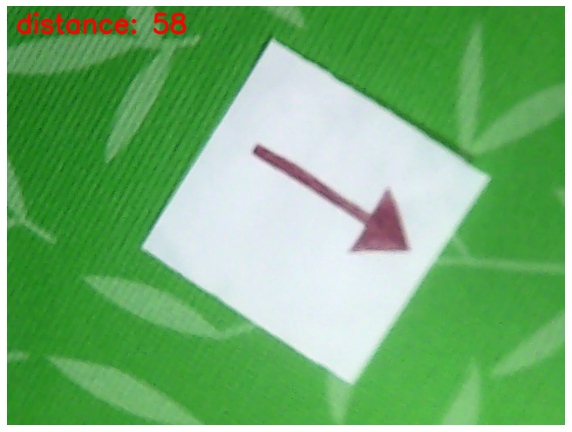

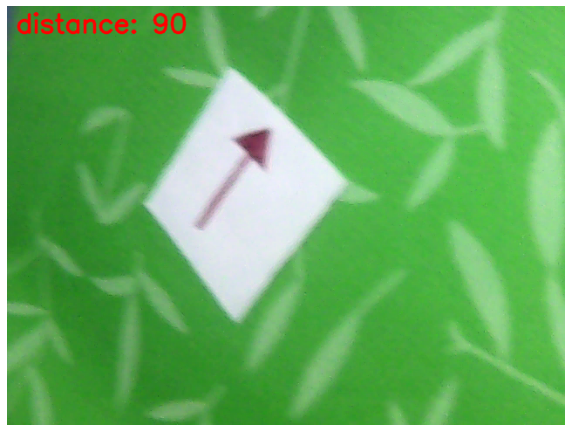

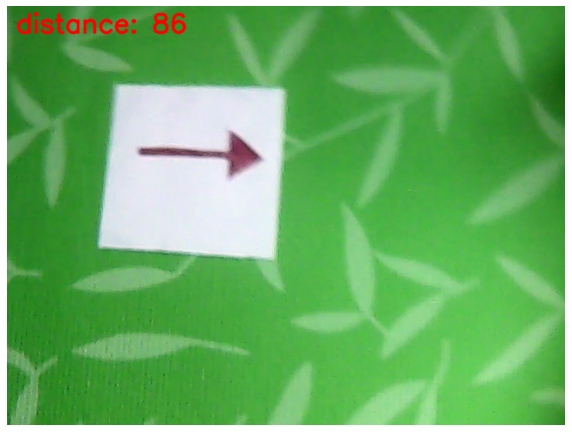

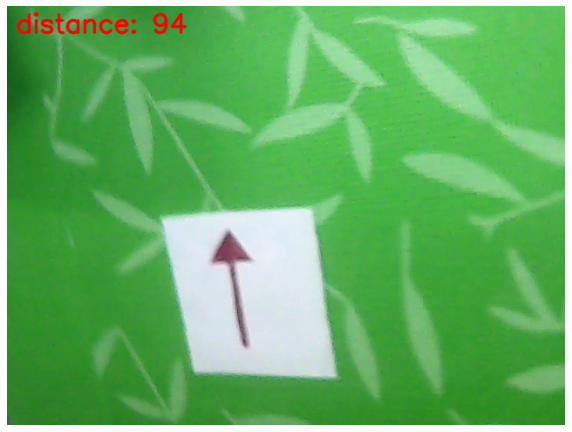

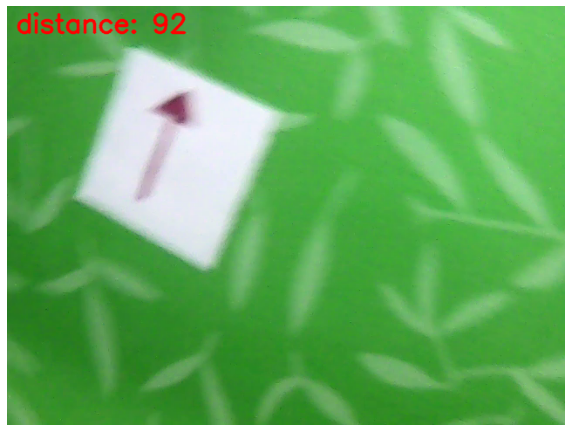

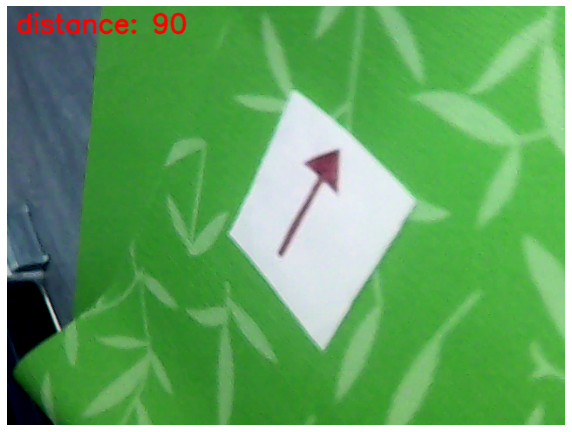

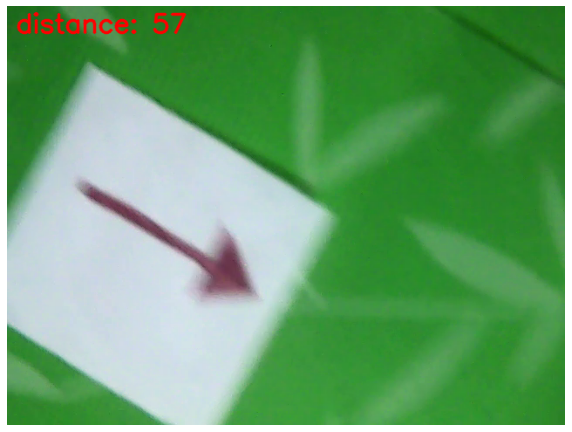

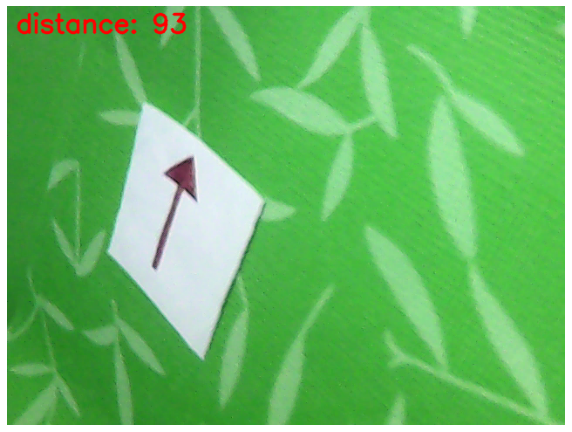

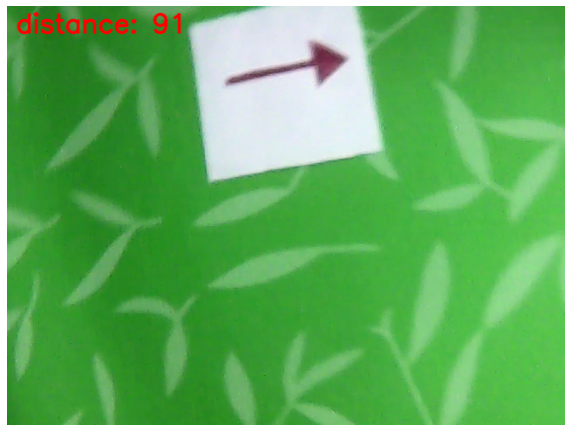

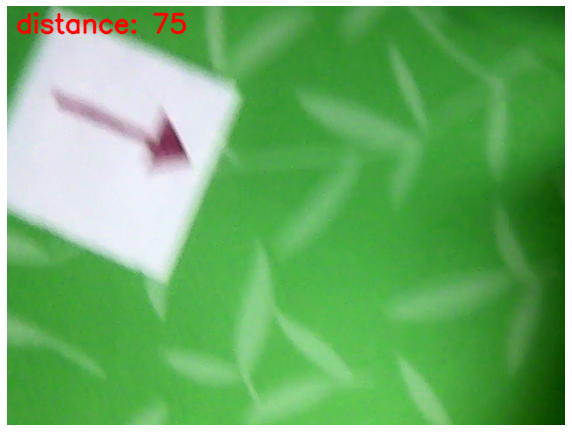

In [165]:
for image in images:
    canvas = image.copy()

    mask     = thresholding(canvas)
    contours = defaultFindContours(mask)

    drawText(canvas, "distance: " + str(int(findPaperDistance(contours))), (10, 30), 2)
    show(canvas)

## Task #3

Код с семинара работал не для всех картинок, проблема была в orderPoints. Пояснения в комментариях.

In [166]:
def orderPoints(pts):
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    # Проблема: если граница почти параллельна прямой x=y, то bl может стать равным br, а tr - равным tl.
    
    s = pts.sum(axis=1)
    diff = np.diff(pts, axis=1) 
    
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    return rect

In [167]:
def newOrderPoints(hull):
    
    # Если почитать документацию cv2.convexHull, то можно узнать, что полученные ею точки расположены против часовой стрелки. Это я и ипользую.
    
    i_min = 0
    for i in range(len(hull)):
        if hull[i][0]**2 + hull[i][1]**2 < hull[i_min][0]**2 + hull[i_min][1]**2:
            i_min = i
        
        
    tl = hull[i_min]
    tr = hull[(i_min + 1) % 4]
    br = hull[(i_min + 2) % 4]
    bl = hull[(i_min + 3) % 4]
        
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    rect[0] = tl
    rect[1] = tr
    rect[2] = br
    rect[3] = bl
    
    return rect

In [168]:
def fourPointTransform(image, pts, canvas=None):
    
    if len(pts) != 4: return None

    rect = newOrderPoints(pts)
    (tl, tr, br, bl) = rect
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    if canvas is not None:
        drawText(canvas, "tl", tuple(map(int, tl)), 2)
        drawText(canvas, "tr", tuple(map(int, tr)), 2)
        drawText(canvas, "br", tuple(map(int, br)), 2)
        drawText(canvas, "bl", tuple(map(int, bl)), 2)

    return warped

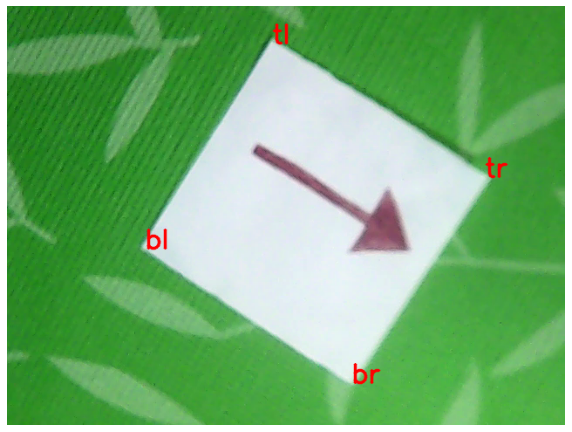

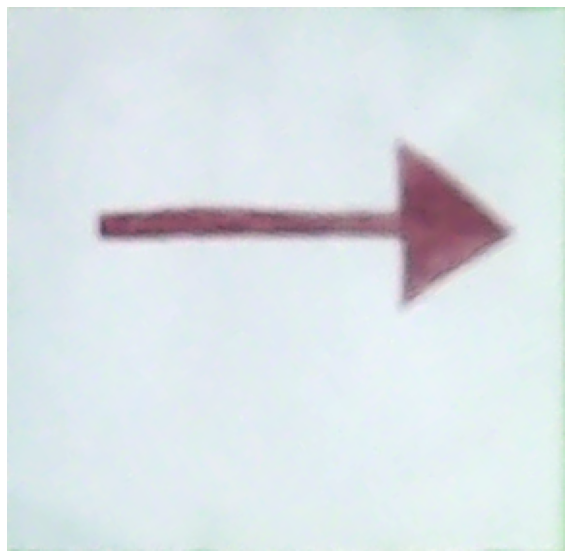

-------------------------------------------------------------------


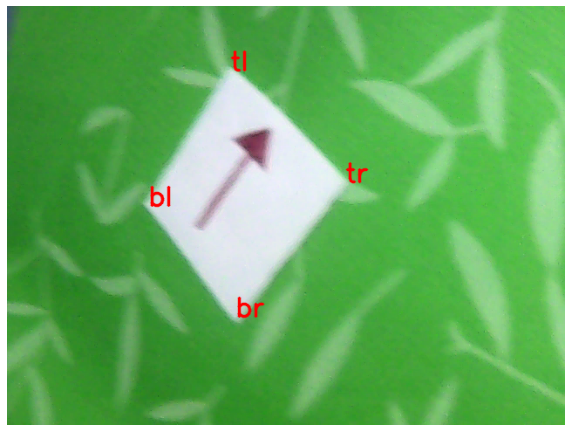

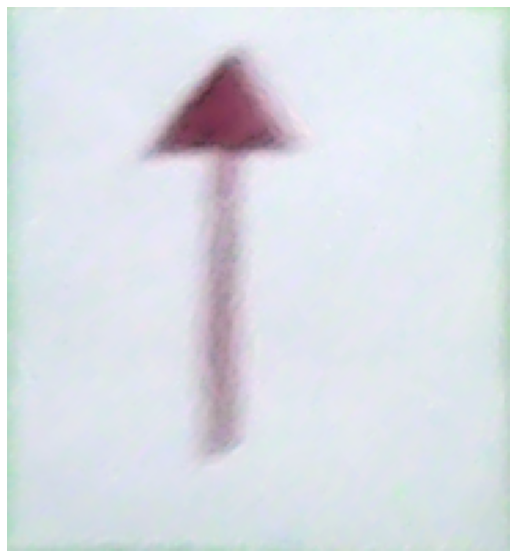

-------------------------------------------------------------------


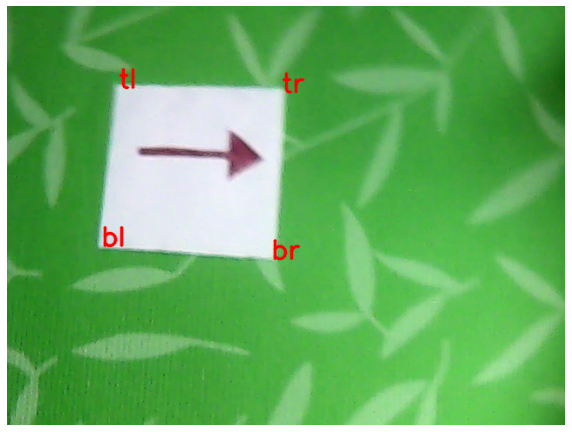

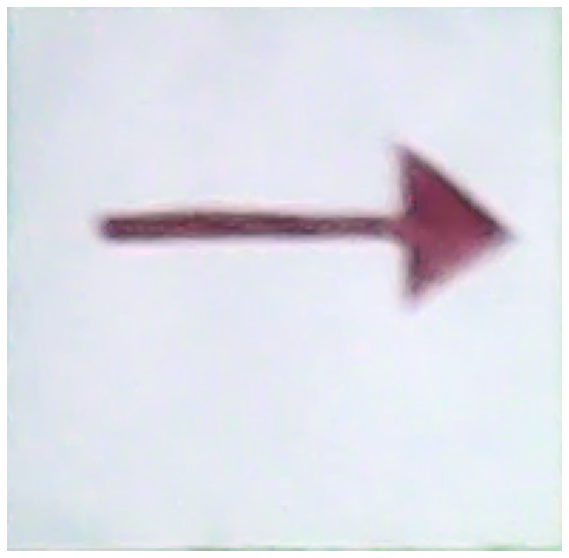

-------------------------------------------------------------------


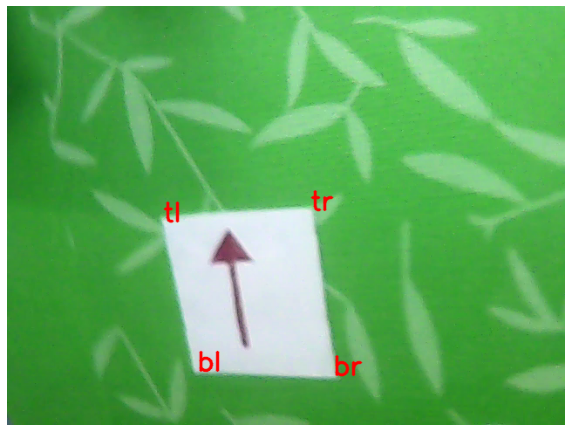

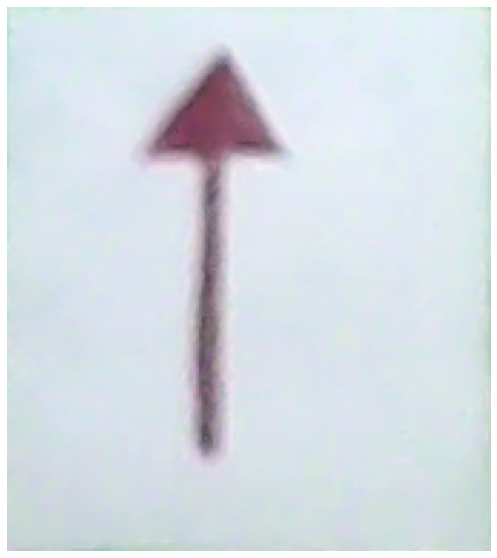

-------------------------------------------------------------------


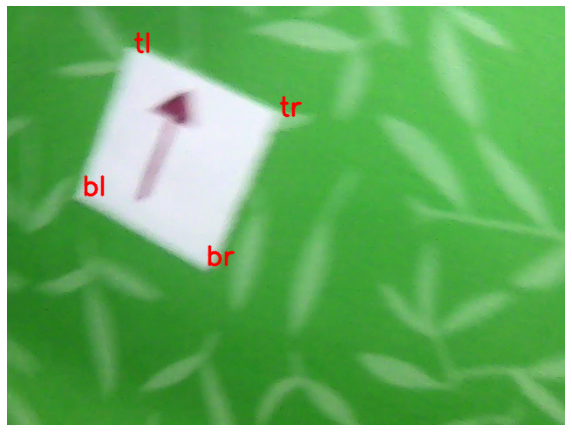

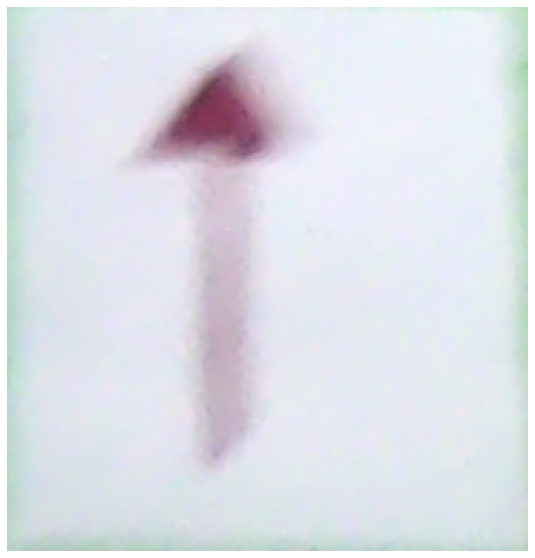

-------------------------------------------------------------------


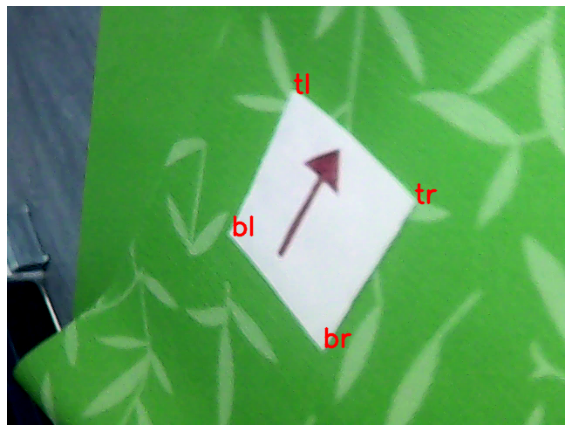

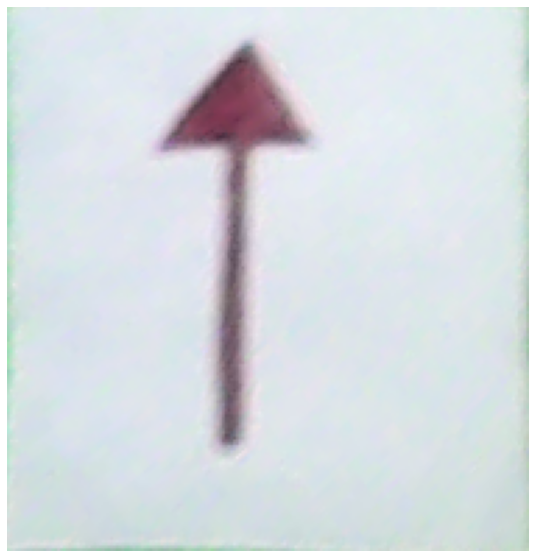

-------------------------------------------------------------------


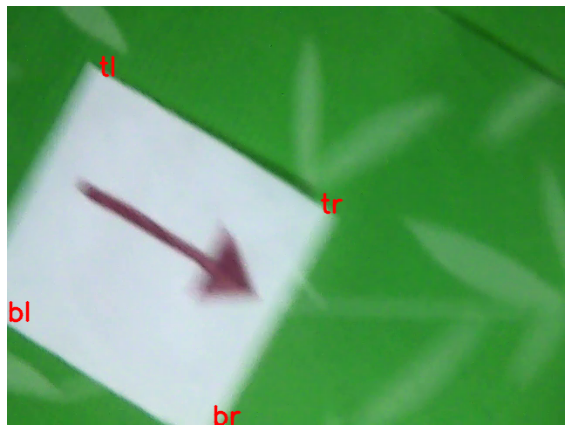

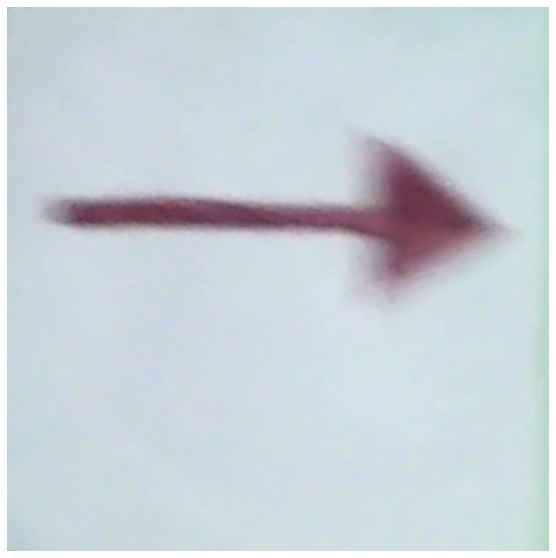

-------------------------------------------------------------------


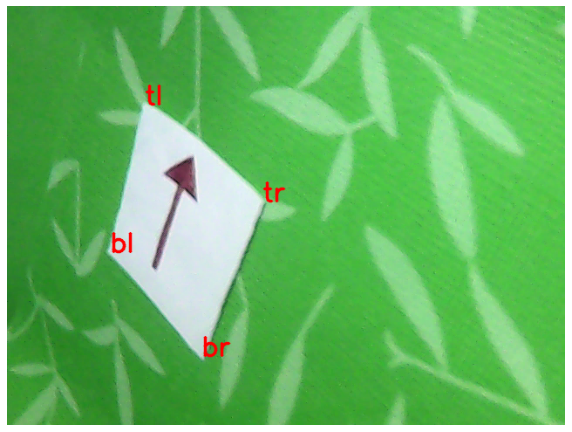

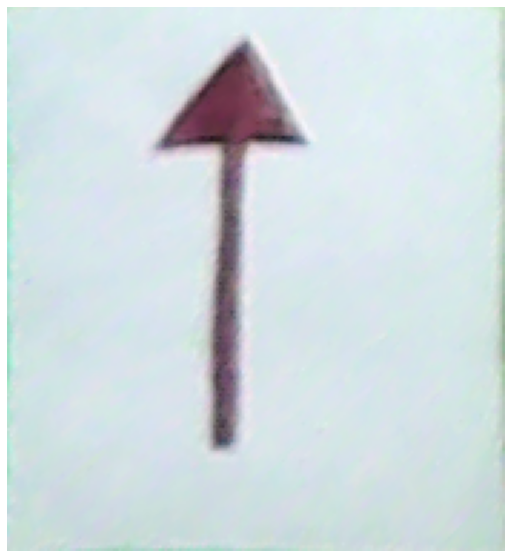

-------------------------------------------------------------------


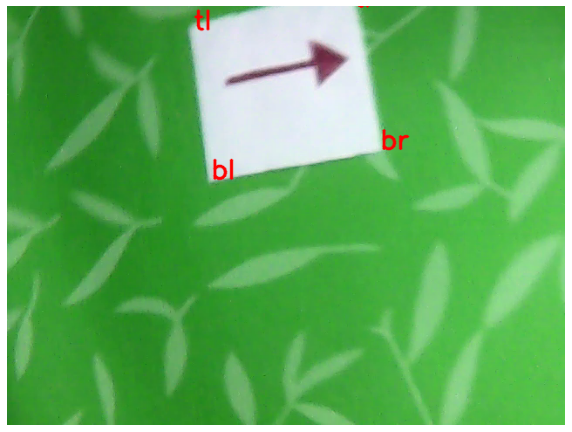

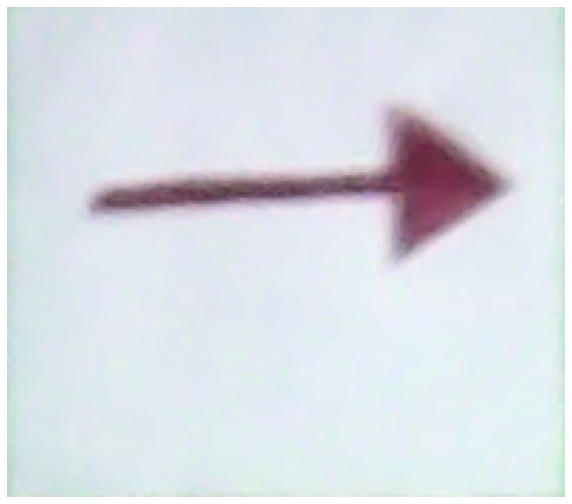

-------------------------------------------------------------------


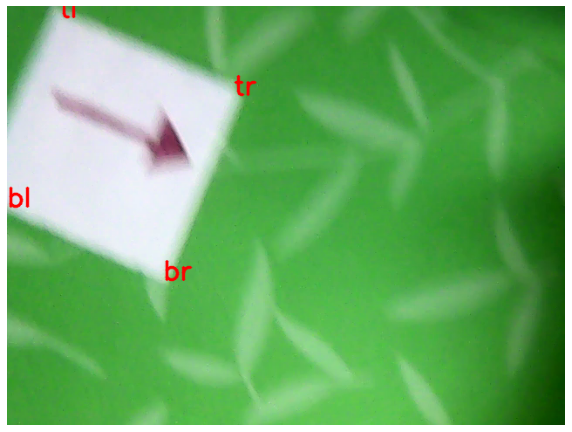

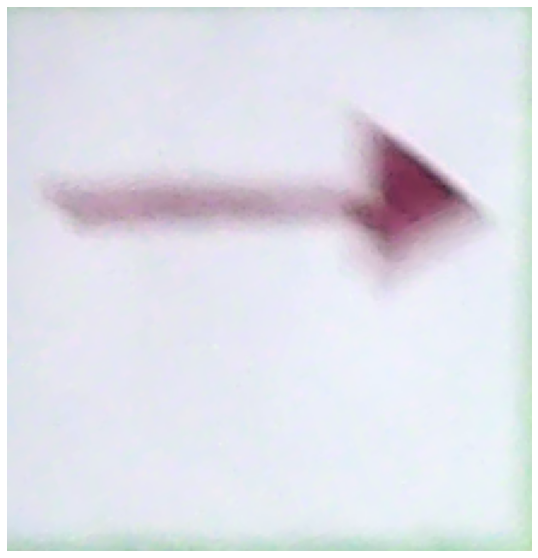

-------------------------------------------------------------------


In [169]:
for image in images:
    
    canvas = image.copy()

    mask    = thresholding(canvas)
    corners = defaultFindContours(mask)

    approx = findPaperBorder(corners)
    warped = fourPointTransform (canvas, np.asarray (approx) [:, 0, :], canvas)
    
    if warped is not None:
        show(canvas)
        show(warped)
    else:
        print("Can't warp: can't properly define corners")

    underline()

## Task #4

Сначала я пытался работать со скелетонизацией и морфологическими преобразованиями, неудачно. Сработал обычный подход через фильтрацией в BGR и findCorners. К сожалению, смазанные изображения распознаются плохо. Я попробовал использовать фильтрацию в hsv, adaptiveThreshold, морфологические преобразования в разных комбинациях. Смазанные стрелки все равно не удалось распознать. Начал задумываться о схожести этих фото с капчей "Отметьте все фото, на которых есть стрелки". Пояснения к коду в комментариях.

>Несколько ячеек ниже не используются, просто сохраню 

In [170]:
def post_hsv(hsv):
    morph = cv2.erode(hsv, (5,5),    iterations = 2) 
    morph = cv2.dilate(morph, (5,5), iterations = 2)
    #morph = hsv
    return morph

def pre_hsv(bgr):
    return cv2.GaussianBlur(img, (3,3), cv2.BORDER_DEFAULT)

In [171]:
def choose_image_mask(source):
    img = source
    img = pre_hsv(img)
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 

    cv2.namedWindow('HSV')

    def nothing(x): pass
    
    hsv_min = ()
    hsv_max = ()

    cv2.createTrackbar('h_min','HSV',0,255,nothing)
    cv2.createTrackbar('s_min','HSV',0,255,nothing)
    cv2.createTrackbar('v_min','HSV',0,255,nothing)
    cv2.createTrackbar('h_max','HSV',0,255,nothing)
    cv2.createTrackbar('s_max','HSV',0,255,nothing)
    cv2.createTrackbar('v_max','HSV',0,255,nothing)

    while(1):
        h_min = cv2.getTrackbarPos('h_min','HSV')
        s_min = cv2.getTrackbarPos('s_min','HSV')
        v_min = cv2.getTrackbarPos('v_min','HSV')
        h_max = cv2.getTrackbarPos('h_max','HSV')
        s_max = cv2.getTrackbarPos('s_max','HSV')
        v_max = cv2.getTrackbarPos('v_max','HSV')

        hsv_min = (h_min, s_min, v_min)
        hsv_max = (h_max, s_max, v_max)

        mask = cv2.inRange(hsv, hsv_min, hsv_max)
        mask = post_hsv(mask)
        
        cv2.imshow('Original',source)
        cv2.imshow('Masked',mask)  
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (hsv_min, hsv_max)


def calculate_average_mask(sources):
    
    sum_h_max = 0
    sum_v_max = 0
    sum_s_max = 0
    
    sum_h_min = 0
    sum_v_min = 0
    sum_s_min = 0
    
    n = 0
    for source in sources:
        
        hsv = choose_image_mask(source)
        
        hsv_min, hsv_max = hsv
        
        sum_h_min += hsv_min[0]
        sum_s_min += hsv_min[1]
        sum_v_min += hsv_min[2]
        
        sum_h_max += hsv_max[0]
        sum_s_max += hsv_max[1]
        sum_v_max += hsv_max[2]
        
        n+=1
    
    hsv_min = (sum_h_min / n, sum_s_min / n, sum_v_min / n)
    hsv_max = (sum_h_max / n, sum_s_max / n, sum_v_max / n)
    
    print("Average thr: "+ str(hsv_min) + " | " + str(hsv_max))
    return (hsv_min, hsv_max)

In [172]:
#hsv_min, hsv_max = calculate_average_mask(images)
#print(hsv_min, hsv_max)

In [173]:
def pre_bgr(bgr):
    return cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)

def post_bgr(bgr):
    return bgr

In [174]:
def choose_bgr_threshold(bgr_best, bgr_worst):
     
    pre_bgr_best  = pre_bgr(bgr_best)
    pre_bgr_worst = pre_bgr(bgr_worst)
    
    cv2.namedWindow('Threshold')
    
    def nothing(x): pass

    cv2.createTrackbar('high','Threshold',0,255,nothing)
    cv2.createTrackbar('low','Threshold',0,255,nothing)

    while(1):
        
        high = cv2.getTrackbarPos('high','Threshold')
        low  = cv2.getTrackbarPos('low','Threshold')
        
        high = (high, high, high)
        low  = (low, low, low)
        
        mask_b = cv2.inRange(pre_bgr_best, low, high)
        mask_b = post_bgr(mask_b)
        
        mask_w = cv2.inRange(pre_bgr_worst, low, high)
        mask_w = post_bgr(mask_w)
        
        cv2.imshow('Best source', bgr_best)
        cv2.imshow('Worst source', bgr_worst)
        
        cv2.imshow('Best mask', mask_b)
        cv2.imshow('Worst mask', mask_w)
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (low, high)

In [175]:
#best  = images[2]
#worst = images[8]

#low_th, high_th = choose_bgr_threshold(best, worst)
#print(low_th, high_th)

#low_th, high_th = (201, 201, 201), (255, 255, 255)

>Код ниже используется. Пояснения в комментариях.

In [176]:
def findArrowEnds(contours, epsilon=0.1):
    
    assert len(contours) > 1

    approx = approximateContour(contours [1], epsilon)
    if len(approx) != 2: return None

    return approx

In [177]:
def getRect(pt, R):
        tl = tuple(pt - (R,R))
        br = tuple(pt + (R,R)) 
        return tl, br

In [178]:
def countPoints(mask, rect):
        
        field = mask[rect[0][1]:rect[1][1], rect[0][0]:rect[1][0]]
        #show(field)
        
        return cv2.countNonZero(field)

In [193]:
def findArrow(mask, corners, canvas=None):

    # Поиск концов стрелки (что из них есть хвост и кончик - неизвестно)
    approx = findArrowEnds(corners)    
    if approx is None: return None

    pt1 = approx[0][0]
    pt2 = approx[1][0]
            
    # {Определение ориентации стрелки}
    
    length = cv2.arcLength(approx, False)
    R = int(0.1 * length)
    
    # Определим квадраты c ребром 2R с центром на концах стрелки
    rect_pt1 = getRect(pt1, R)
    rect_pt2 = getRect(pt2, R)

    # Посчитаем точки внутри каждого квадрата
    count1 = countPoints(mask, rect_pt1)
    count2 = countPoints(mask, rect_pt2)
    
    # from, where
    arrow = (0,0)
    
    # Точка, вокруг которой содержится наименьшее количество точек, находится на кончике стрелки
    if count1 < count2:
        arrow = pt2, pt1
    else:
        arrow = pt1, pt2
    
    # Красивая отрисовка процесса
    if canvas is not None:
        drawText(canvas, "1", pt1, 2)
        drawText(canvas, "2", pt2, 2)
        drawText(canvas, "count 1: "+str(count1), (10, 35), 3, (0,0,255))
        drawText(canvas, "count 2: "+str(count2), (10 + 300, 35), 3, (0, 0, 255))
    
    # Готово, у нас есть две упорядоченные точки: хвост и кончик
    return arrow

In [194]:
def drawArrow(canvas, arrow, color, thickness):
    cv2.arrowedLine(canvas, tuple(arrow[0]), tuple(arrow[1]), color, thickness, cv2.LINE_AA, 0, 0.3)

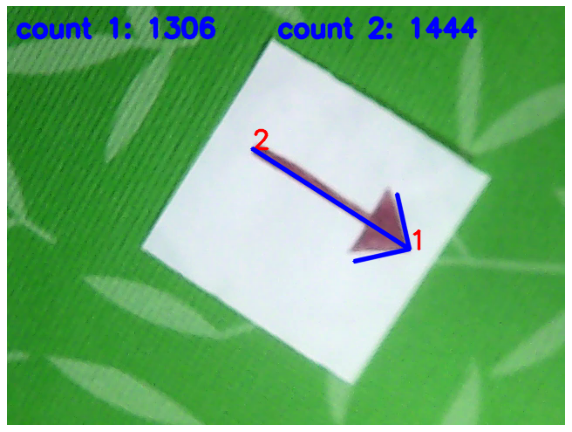

-------------------------------------------------------------------


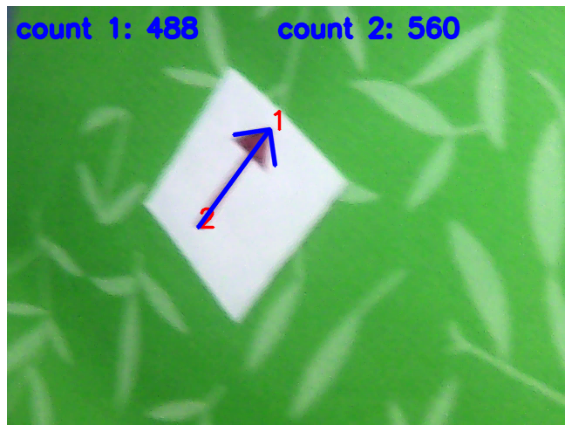

-------------------------------------------------------------------


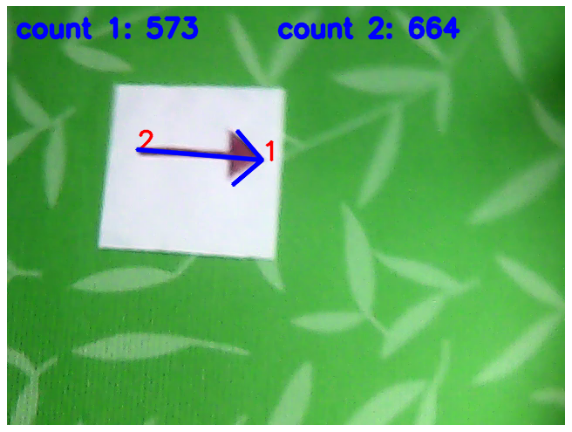

-------------------------------------------------------------------


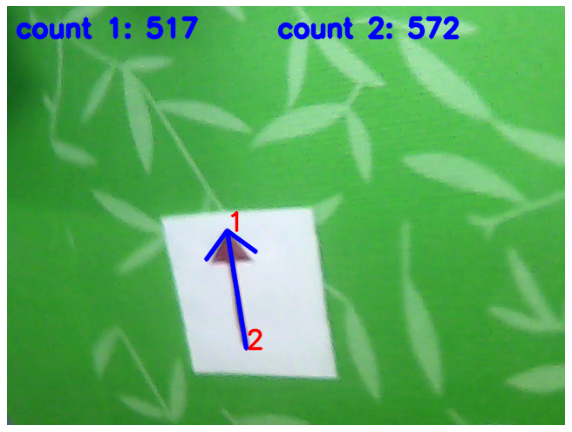

-------------------------------------------------------------------
Cant find arrow


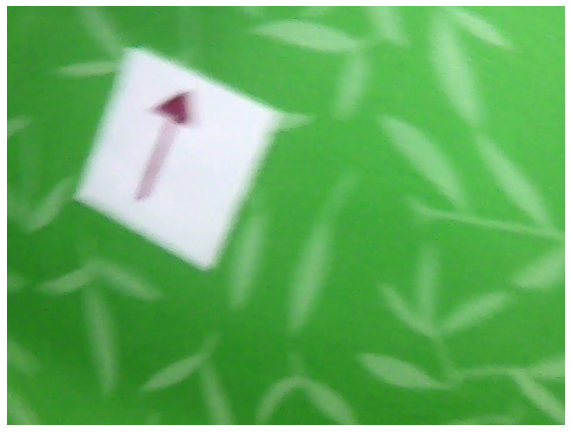

-------------------------------------------------------------------


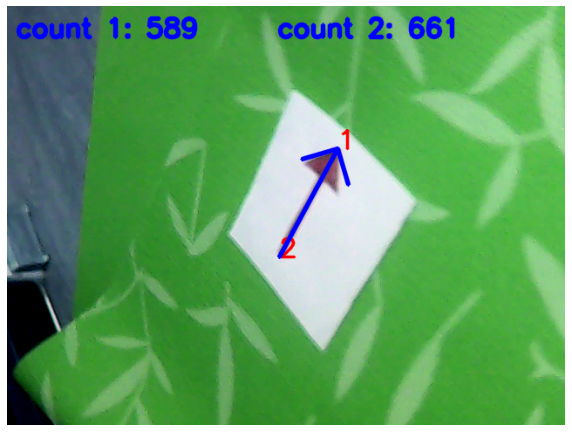

-------------------------------------------------------------------


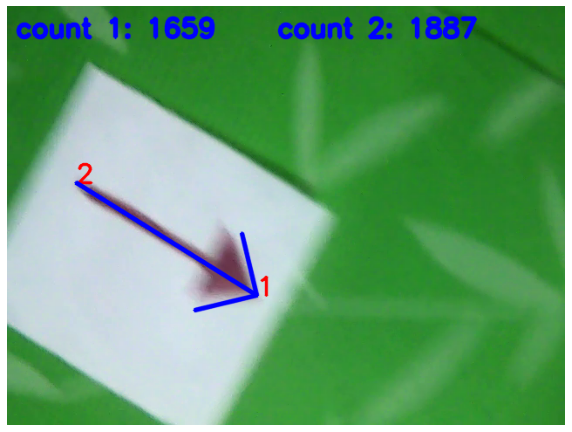

-------------------------------------------------------------------


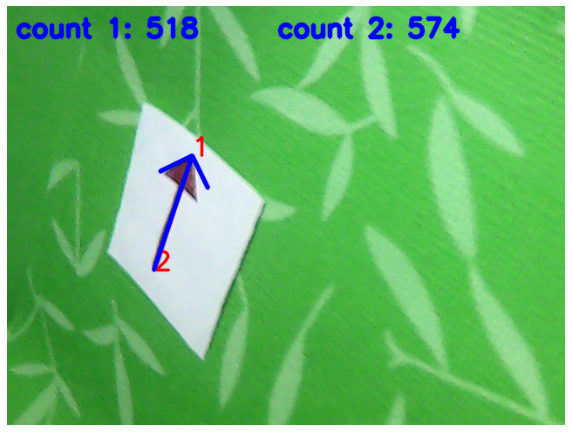

-------------------------------------------------------------------


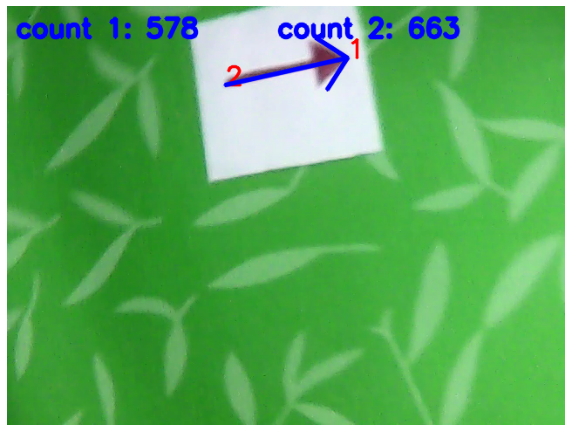

-------------------------------------------------------------------


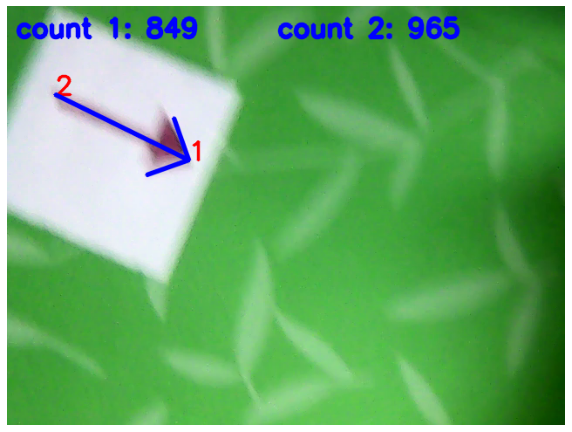

-------------------------------------------------------------------


In [195]:
for image in images:
    canvas = image.copy()

    mask    = thresholding(canvas)
    contours = defaultFindContours(mask)

    arrow = findArrow(mask, contours, canvas)
    
    if arrow:
        drawArrow(canvas, arrow, (0,0,255), 3)
    else:
        print("Cant find arrow")
    
    show(canvas)
    underline()